In [195]:
import numpy as np
from functools import reduce
from astropy.io import fits
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import scipy.optimize as opt;

from photutils.isophote import Ellipse, EllipseGeometry, build_ellipse_model

In [235]:
body="NGC1407"

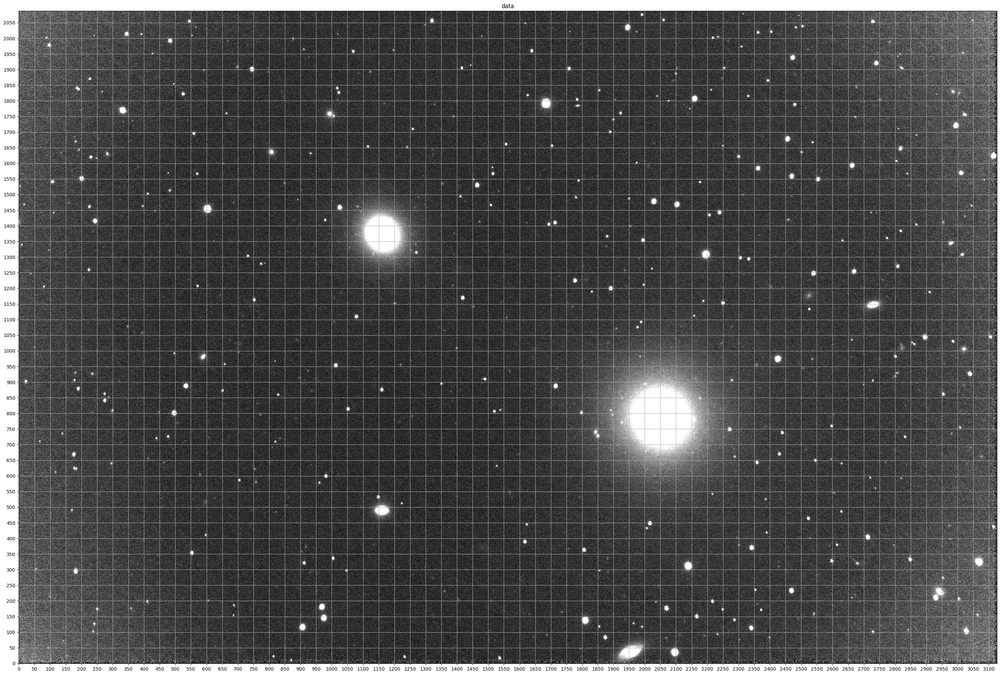

In [236]:
hdu = fits.open(f"./data/{body}_r.fits")
data = hdu[0].data.astype(float)
hdu.close()

fig, ax = plt.subplots(1, 1, figsize=(50, 25))

ax.imshow(data, origin='lower', cmap='gray', vmin=np.percentile(data, 1), vmax=np.percentile(data, 99))
ax.set_title("data")
plt.xticks(range(0, data.shape[1], 50))
plt.yticks(range(0, data.shape[0], 50))
plt.tick_params()
plt.grid()

In [237]:
# NGC 1399, sma 10
#centers = [[1760, 1390], [1400, 600], ]
#objects = ['NGC1404', 'NGC1399', ]

# NGC 1407, sma 50
centers = [[2050, 775], [1160, 1375], ]
objects = ['NGC1407', 'NGC1400', ]

background_value = np.median(data[1500:1510,1000:1010])

def fit_isophotes(center):
    print(f"fitting galaxy with center x0={center[0]}, y0={center[1]}")
    geometry = EllipseGeometry(
        x0=center[0], 
        y0=center[1],
        sma=50,
        eps=0.2,
        pa=3.14/2)

    ellipse = Ellipse(data, geometry=geometry)
    isolist = ellipse.fit_image(conver=0.0005)
    return isolist

def create_galaxy_model(isolist):
    model_image = build_ellipse_model(data.shape, isolist)
    return model_image

iso_lists = list(map(fit_isophotes, centers))
composite_model = reduce(lambda x, y: x + y , map(create_galaxy_model, iso_lists))
composite_model = np.where(composite_model == 0, background_value, composite_model)

fitting galaxy with center x0=2050, y0=775
fitting galaxy with center x0=1160, y0=1375


[]

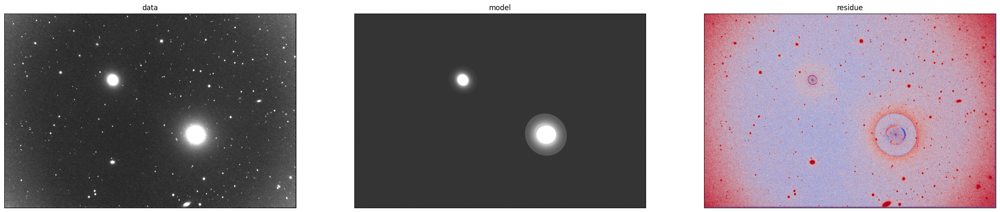

In [238]:
fig, ax = plt.subplots(1, 3, figsize=(30, 10))

ax[0].imshow(data, origin='lower', cmap='gray', vmin=np.percentile(data, 1), vmax=np.percentile(data, 99))
ax[0].set_title("data")
ax[0].set_xticks([])
ax[0].set_yticks([])

ax[1].imshow(composite_model, origin='lower', cmap='gray', vmin=np.percentile(data, 1), vmax=np.percentile(data, 99))
ax[1].set_title("model")
ax[1].set_xticks([])
ax[1].set_yticks([])

ax[2].imshow(data - composite_model, origin='lower', cmap='coolwarm', vmin=-100, vmax=100)
ax[2].set_title("residue")
ax[2].set_xticks([])
ax[2].set_yticks([])

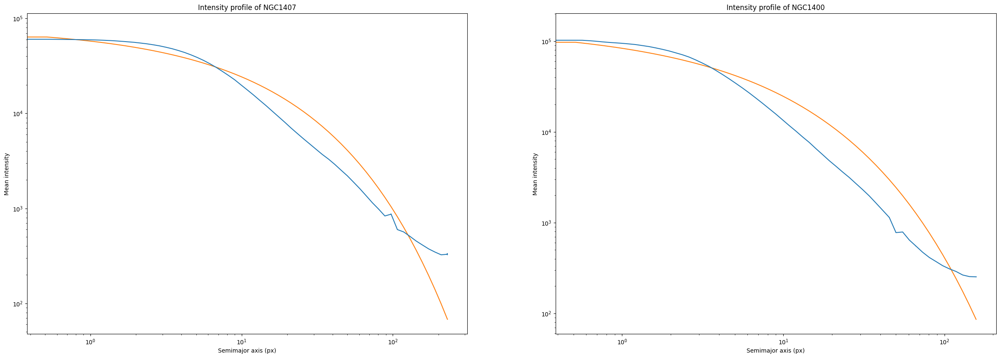

In [239]:
galaxy_count = len(iso_lists)

fig, ax = plt.subplots(1, galaxy_count, figsize=(30, 10))

for i in range(0, galaxy_count):
    
    y = list(map(lambda iso : iso.intens, iso_lists[i]))
    x = list(map(lambda iso : iso.sma, iso_lists[i]))
    yerr = list(map(lambda iso : iso.int_err, iso_lists[i]))
    
    sersic_init = models.Sersic1D(amplitude=10, r_eff=3, n=1)
    fitter = fitting.LevMarLSQFitter()
    sersic_fit = fitter(sersic_init, x, y)

    ax[i].errorbar(x, y, yerr)
    ax[i].plot(x, sersic_fit(x), label="fit")
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    ax[i].set_title(f'Intensity profile of {objects[i]}')
    ax[i].set_xlabel('Semimajor axis (px)')
    ax[i].set_ylabel('Mean intensity')